## Installation



In [ ]:
%%capture
!pip install remotezip tqdm opencv-python==4.5.2.52 opencv-python-headless==4.5.2.52 tf-models-official
!pip install remotezip
!pip install tf-models-official
!pip install -q mediapy


In [ ]:
import tqdm
import random
import pathlib
import itertools
import collections
import os

import cv2
import numpy as np
import remotezip as rz
import seaborn as sns
import matplotlib.pyplot as plt

import keras
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

# Import the MoViNet model from TensorFlow Models (tf-models-official) for the MoViNet model
from official.projects.movinet.modeling import movinet
from official.projects.movinet.modeling import movinet_model

import mediapy as media


## Download a subset of the UCF101 dataset

The [UCF101 dataset](https://www.tensorflow.org/datasets/catalog/ucf101) contains 101 categories of different actions in video, primarily used in action recognition. You will use a subset of these categories in this demo.

In [ ]:
 URL = 'https://storage.googleapis.com/thumos14_files/UCF101_videos.zip'

In [ ]:
#@title

def get_class(fname):

  return fname.split('_')[-3]


def list_files_per_class(zip_url):

  files = []
  with rz.RemoteZip(URL) as zip:
    for zip_info in zip.infolist():
      files.append(zip_info.filename)
  return files

def get_class(fname):

  return fname.split('_')[-3]

def get_files_per_class(files):

  files_for_class = collections.defaultdict(list)
  for fname in files:
    class_name = get_class(fname)
    files_for_class[class_name].append(fname)
  return files_for_class

def select_subset_of_classes(files_for_class, classes, files_per_class):

  files_subset = dict()

  for class_name in classes:
    class_files = files_for_class[class_name]
    files_subset[class_name] = class_files[:files_per_class]

  return files_subset

def download_from_zip(zip_url, to_dir, file_names):

  with rz.RemoteZip(zip_url) as zip:
    for fn in tqdm.tqdm(file_names):
      class_name = get_class(fn)
      zip.extract(fn, str(to_dir / class_name))
      unzipped_file = to_dir / class_name / fn

      fn = pathlib.Path(fn).parts[-1]
      output_file = to_dir / class_name / fn
      unzipped_file.rename(output_file)



def download_ucf_101_subset(zip_url, num_classes, splits, download_dir,classes_1):

  files = list_files_from_zip_url(zip_url)
  for f in files:
    path = os.path.normpath(f)
    tokens = path.split(os.sep)
    if len(tokens) <= 2:
      files.remove(f) # Remove that item from the list if it does not have a filename

  files_for_class = get_files_per_class(files)

  classes = classes_1

  for cls in classes:
    random.shuffle(files_for_class[cls])

  files_for_class = {x: files_for_class[x] for x in classes}

  dirs = {}
  for split_name, split_count in splits.items():
    print(split_name, ":")
    split_dir = download_dir / split_name
    split_files, files_for_class = split_class_lists(files_for_class, split_count)
    download_from_zip(zip_url, split_dir, split_files)
    dirs[split_name] = split_dir

  return dirs

def split_class_lists(files_for_class, count):

  split_files = []
  remainder = {}
  for cls in files_for_class:
    split_files.extend(files_for_class[cls][:count])
    remainder[cls] = files_for_class[cls][count:]
  return split_files, remainder


def format_frames(frame, output_size):
  """
    Pad and resize an image from a video.

    Args:
      frame: Image that needs to resized and padded.
      output_size: Pixel size of the output frame image.

    Return:
      Formatted frame with padding of specified output size.
  """
  frame = tf.image.convert_image_dtype(frame, tf.float32)
  frame = tf.image.resize_with_pad(frame, *output_size)
  return frame

def frames_from_video_file(video_path, n_frames, output_size = (224,224), frame_step = 15):

  # Read each video frame by frame
  result = []
  src = cv2.VideoCapture(str(video_path))

  video_length = src.get(cv2.CAP_PROP_FRAME_COUNT)

  need_length = 1 + (n_frames - 1) * frame_step

  if need_length > video_length:
    start = 0
  else:
    max_start = video_length - need_length
    start = random.randint(0, max_start + 1)

  src.set(cv2.CAP_PROP_POS_FRAMES, start)
  ret, frame = src.read()
  result.append(format_frames(frame, output_size))

  for _ in range(n_frames - 1):
    for _ in range(frame_step):
      ret, frame = src.read()
    if ret:
      frame = format_frames(frame, output_size)
      result.append(frame)
    else:
      result.append(np.zeros_like(result[0]))
  src.release()
  result = np.array(result)[..., [2, 1, 0]]

  return result

def list_files_from_zip_url(zip_url):

  files = []
  with rz.RemoteZip(zip_url) as zip:
    for zip_info in zip.infolist():
      files.append(zip_info.filename)
  return files

class FrameGenerator:
  def __init__(self, path, n_frames, training = False):

    self.path = path
    self.n_frames = n_frames
    self.training = training
    self.class_names = sorted(set(p.name for p in self.path.iterdir() if p.is_dir()))
    self.class_ids_for_name = dict((name, idx) for idx, name in enumerate(self.class_names))

  def get_files_and_class_names(self):
    video_paths = list(self.path.glob('*/*.avi'))
    classes = [p.parent.name for p in video_paths]
    return video_paths, classes

  def __call__(self):
    video_paths, classes = self.get_files_and_class_names()

    pairs = list(zip(video_paths, classes))

    if self.training:
      random.shuffle(pairs)

    for path, name in pairs:
      video_frames = frames_from_video_file(path, self.n_frames)
      label = self.class_ids_for_name[name] # Encode labels
      yield video_frames, label

In [ ]:
def list_files_from_zip_url(zip_url):
  """ List the files in each class of the dataset given a URL with the zip file.

    Args:
      zip_url: A URL from which the files can be extracted from.

    Returns:
      List of files in each of the classes.
  """
  files = []
  with rz.RemoteZip(zip_url) as zip:
    for zip_info in zip.infolist():
      files.append(zip_info.filename)
  return files

In [ ]:
files = list_files_from_zip_url(URL)
files = [f for f in files if f.endswith('.avi')]
files[:10]

['UCF101/v_ApplyEyeMakeup_g01_c01.avi',
 'UCF101/v_ApplyEyeMakeup_g01_c02.avi',
 'UCF101/v_ApplyEyeMakeup_g01_c03.avi',
 'UCF101/v_ApplyEyeMakeup_g01_c04.avi',
 'UCF101/v_ApplyEyeMakeup_g01_c05.avi',
 'UCF101/v_ApplyEyeMakeup_g01_c06.avi',
 'UCF101/v_ApplyEyeMakeup_g02_c01.avi',
 'UCF101/v_ApplyEyeMakeup_g02_c02.avi',
 'UCF101/v_ApplyEyeMakeup_g02_c03.avi',
 'UCF101/v_ApplyEyeMakeup_g02_c04.avi']

In [ ]:
def get_class(fname):
  """ Retrieve the name of the class given a filename.

    Args:
      fname: Name of the file in the UCF101 dataset.

    Returns:
      Class that the file belongs to.
  """
  return fname.split('_')[-3]

In [ ]:
def get_files_per_class(files):

  files_for_class = collections.defaultdict(list)
  for fname in files:
    class_name = get_class(fname)
    files_for_class[class_name].append(fname)
  return files_for_class

Once you have the list of files per class, you can choose how many classes you would like to use and how many videos you would like per class in order to create your dataset.

In [ ]:
FILES_PER_CLASS = 100

In [ ]:
files_for_class = get_files_per_class(files)
classes = list(files_for_class.keys())

All the classes of UCF101 dataset

In [ ]:
classes

['ApplyEyeMakeup',
 'ApplyLipstick',
 'Archery',
 'BabyCrawling',
 'BalanceBeam',
 'BandMarching',
 'BaseballPitch',
 'BasketballDunk',
 'Basketball',
 'BenchPress',
 'Biking',
 'Billiards',
 'BlowDryHair',
 'BlowingCandles',
 'BodyWeightSquats',
 'Bowling',
 'BoxingPunchingBag',
 'BoxingSpeedBag',
 'BreastStroke',
 'BrushingTeeth',
 'CleanAndJerk',
 'CliffDiving',
 'CricketBowling',
 'CricketShot',
 'CuttingInKitchen',
 'Diving',
 'Drumming',
 'Fencing',
 'FieldHockeyPenalty',
 'FloorGymnastics',
 'FrisbeeCatch',
 'FrontCrawl',
 'GolfSwing',
 'Haircut',
 'Hammering',
 'HammerThrow',
 'HandstandPushups',
 'HandstandWalking',
 'HeadMassage',
 'HighJump',
 'HorseRace',
 'HorseRiding',
 'HulaHoop',
 'IceDancing',
 'JavelinThrow',
 'JugglingBalls',
 'JumpingJack',
 'JumpRope',
 'Kayaking',
 'Knitting',
 'LongJump',
 'Lunges',
 'MilitaryParade',
 'Mixing',
 'MoppingFloor',
 'Nunchucks',
 'ParallelBars',
 'PizzaTossing',
 'PlayingCello',
 'PlayingDaf',
 'PlayingDhol',
 'PlayingFlute',
 'Play

These are the selected classes from the above classes list

In [ ]:
classes_1 = ['Archery',
 'BabyCrawling',
 'BoxingPunchingBag',
 'BoxingSpeedBag',
 'CliffDiving',
 'CuttingInKitchen',
 'Diving',
 'Fencing',
 'Hammering',
 'HammerThrow',
 'HighJump',
 'HulaHoop',
 'IceDancing',
 'JavelinThrow',
 'LongJump',
 'Mixing',
 'MoppingFloor',
 'PoleVault',
 'Punch',
 'SalsaSpin',
 'Shotput',
 'SumoWrestling',
 'TaiChi',
 'ThrowDiscus',
 'TrampolineJumping']

NUM_CLASSES = len(classes_1)

In [ ]:
print('Num classes:', len(classes))
print('Num videos for class[0]:', len(files_for_class[classes[0]]))

Num classes: 101
Num videos for class[0]: 145


Create a new function called `select_subset_of_classes` that selects a subset of the classes present within the dataset and a particular number of files per class:

In [ ]:
def select_subset_of_classes(files_for_class, classes, files_per_class):

  files_subset = dict()

  for class_name in classes:
    class_files = files_for_class[class_name]
    files_subset[class_name] = class_files[:files_per_class]

  return files_subset

In [ ]:
files_subset = select_subset_of_classes(files_for_class, classes_1, FILES_PER_CLASS)
list(files_subset.keys())

['Archery',
 'BabyCrawling',
 'BoxingPunchingBag',
 'BoxingSpeedBag',
 'CliffDiving',
 'CuttingInKitchen',
 'Diving',
 'Fencing',
 'Hammering',
 'HammerThrow',
 'HighJump',
 'HulaHoop',
 'IceDancing',
 'JavelinThrow',
 'LongJump',
 'Mixing',
 'MoppingFloor',
 'PoleVault',
 'Punch',
 'SalsaSpin',
 'Shotput',
 'SumoWrestling',
 'TaiChi',
 'ThrowDiscus',
 'TrampolineJumping']

Define helper functions that split the videos into training, validation, and test sets. The videos are downloaded from a URL with the zip file, and placed into their respective subdirectiories.

In [ ]:
def download_from_zip(zip_url, to_dir, file_names):
  """ Download the contents of the zip file from the zip URL.

    Args:
      zip_url: A URL with a zip file containing data.
      to_dir: A directory to download data to.
      file_names: Names of files to download.
  """
  with rz.RemoteZip(zip_url) as zip:
    for fn in tqdm.tqdm(file_names):
      class_name = get_class(fn)
      zip.extract(fn, str(to_dir / class_name))
      unzipped_file = to_dir / class_name / fn

      fn = pathlib.Path(fn).parts[-1]
      output_file = to_dir / class_name / fn
      unzipped_file.rename(output_file)

In [ ]:
def split_class_lists(files_for_class, count):

  split_files = []
  remainder = {}
  for cls in files_for_class:
    split_files.extend(files_for_class[cls][:count])
    remainder[cls] = files_for_class[cls][count:]
  return split_files, remainder

In [ ]:
def download_ucf_101_subset(zip_url, num_classes, splits, download_dir,classes_1):

  files = list_files_from_zip_url(zip_url)
  for f in files:
    path = os.path.normpath(f)
    tokens = path.split(os.sep)
    if len(tokens) <= 2:
      files.remove(f) # Remove that item from the list if it does not have a filename

  files_for_class = get_files_per_class(files)

  # classes = list(files_for_class.keys())[:num_classes]
  classes = classes_1

  for cls in classes:
    random.shuffle(files_for_class[cls])

  # Only use the number of classes you want in the dictionary
  files_for_class = {x: files_for_class[x] for x in classes}

  dirs = {}
  for split_name, split_count in splits.items():
    print(split_name, ":")
    split_dir = download_dir / split_name
    split_files, files_for_class = split_class_lists(files_for_class, split_count)
    download_from_zip(zip_url, split_dir, split_files)
    dirs[split_name] = split_dir

  return dirs

The below URL contains a zip file with the UCF 101 dataset. Create a function that uses the `remotezip` library to examine the contents of the zip file in that URL:

In [ ]:
 URL = 'https://storage.googleapis.com/thumos14_files/UCF101_videos.zip'

In [ ]:
download_dir = pathlib.Path('./UCF101_subset/')
subset_paths = download_ucf_101_subset(URL,
                                       num_classes = NUM_CLASSES,
                                       splits = {"train": 30, "val": 10, "test": 10},
                                       download_dir = download_dir,
                                       classes_1=classes_1)

train :


100%|██████████| 750/750 [12:25<00:00,  1.01it/s]


val :


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


test :


100%|██████████| 250/250 [03:45<00:00,  1.11it/s]


After downloading the data, you should now have a copy of a subset of the UCF101 dataset. Run the following code to print the total number of videos you have amongst all your subsets of data.

In [ ]:
video_count_train = len(list(download_dir.glob('train/*/*.avi')))
video_count_val = len(list(download_dir.glob('val/*/*.avi')))
video_count_test = len(list(download_dir.glob('test/*/*.avi')))
video_total = video_count_train + video_count_val + video_count_test
print(f"Total videos: {video_total}")

Total videos: 1250


## Create the training and test datasets

In [ ]:
batch_size = 8
num_frames = 8

output_signature = (tf.TensorSpec(shape = (None, None, None, 3), dtype = tf.float32),
                    tf.TensorSpec(shape = (), dtype = tf.int16))

train_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['train'], num_frames, training = True),
                                          output_signature = output_signature)
train_ds = train_ds.batch(batch_size)

test_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['test'], num_frames),
                                         output_signature = output_signature)
test_ds = test_ds.batch(batch_size)

val_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['val'], num_frames),
                                          output_signature = output_signature)
val_ds = val_ds.batch(batch_size)

In [ ]:
for frames, labels in train_ds.take(NUM_CLASSES):
  print(labels)

tf.Tensor([24  5 11  0  9 14 22 19], shape=(8,), dtype=int16)
tf.Tensor([ 1 18 14  2  2 22 20  9], shape=(8,), dtype=int16)
tf.Tensor([22  9  9 19 15  0 15  7], shape=(8,), dtype=int16)
tf.Tensor([20 24 17 16  1  7  3 24], shape=(8,), dtype=int16)
tf.Tensor([ 1 15  5  6  6 14 12 24], shape=(8,), dtype=int16)
tf.Tensor([19  8  4 10  4 18 23  5], shape=(8,), dtype=int16)
tf.Tensor([23  7  9 20  2  0 16 19], shape=(8,), dtype=int16)
tf.Tensor([10  6  1  3  2 24 17 12], shape=(8,), dtype=int16)
tf.Tensor([13 21  5 22  9 16  4  1], shape=(8,), dtype=int16)
tf.Tensor([20 19 14  7  6 17 13 24], shape=(8,), dtype=int16)
tf.Tensor([ 7  4 15  1  5 16  8 20], shape=(8,), dtype=int16)
tf.Tensor([21  2 15 17  1  4 15  7], shape=(8,), dtype=int16)
tf.Tensor([11  6  8 12 21 24 16 18], shape=(8,), dtype=int16)
tf.Tensor([19  3 15 24 22 23 21  1], shape=(8,), dtype=int16)
tf.Tensor([11 23 24 24 12 14  8 11], shape=(8,), dtype=int16)
tf.Tensor([ 1  8 22  2 10  2 22 18], shape=(8,), dtype=int16)
tf.Tenso

Take a look at the shape of the data.

In [ ]:
print(f"Shape: {frames.shape}")
print(f"Label: {labels.shape}")

Shape: (8, 8, 224, 224, 3)
Label: (8,)


,,,,,,,

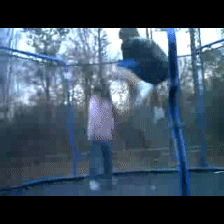
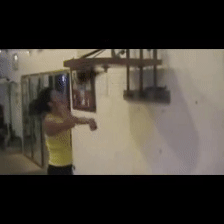
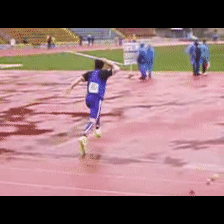
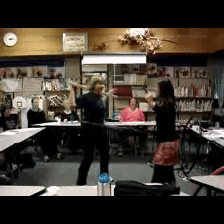
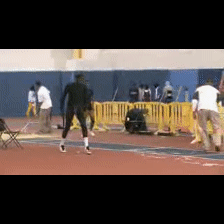
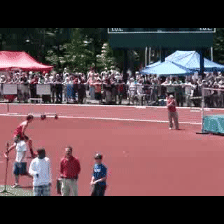
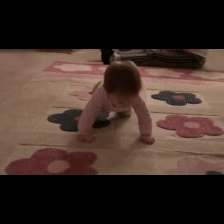
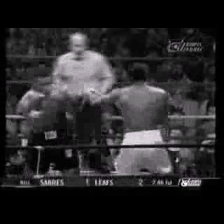

In [ ]:
videos, labels = next(iter(train_ds))
media.show_videos(videos.numpy(), codec='gif', fps=8)

## Download a pre-trained MoViNet model



In [ ]:
model_id = 'a2'
resolution = 224

tf.keras.backend.clear_session()

backbone = movinet.Movinet(model_id=model_id)
backbone.trainable = False

# Set num_classes=600 to load the pre-trained weights from the original model
model = movinet_model.MovinetClassifier(backbone=backbone, num_classes=600)
model.build([None, None, None, None, 3])

# Load pre-trained weights
!wget https://storage.googleapis.com/tf_model_garden/vision/movinet/movinet_a0_base.tar.gz -O movinet_a0_base.tar.gz -q
!tar -xvf movinet_a0_base.tar.gz

checkpoint_dir = f'movinet_{model_id}_base'
checkpoint_path = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint = tf.train.Checkpoint(model=model)
status = checkpoint.restore(checkpoint_path)
status.assert_existing_objects_matched()

movinet_a0_base/
movinet_a0_base/checkpoint
movinet_a0_base/ckpt-1.data-00000-of-00001
movinet_a0_base/ckpt-1.index


In [ ]:
def build_classifier(batch_size, num_frames, resolution, backbone, num_classes):
  """Builds a classifier on top of a backbone model."""
  model = movinet_model.MovinetClassifier(
      backbone=backbone,
      num_classes=num_classes)
  model.build([batch_size, num_frames, resolution, resolution, 3])

  return model

In [ ]:
batch_size, num_frames, resolution, backbone, NUM_CLASSES

(8,
 8,
 224,
 25)

In [ ]:
model = build_classifier(batch_size, num_frames, resolution, backbone, NUM_CLASSES)

In [ ]:
model.summary()

Model: "movinet_classifier_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image (InputLayer)          [(None, None, None, Non   0         
                             e, 3)]                              
                                                                 
 movinet (Movinet)           ({'stem': (None, None,    911583    
                             None, None, 8),                     
                              'block0_layer0': (None             
                             , None, None, None, 8),             
                              'block1_layer0': (None             
                             , None, None, None, 32)             
                             , 'block1_layer1': (Non             
                             e, None, None, None, 32             
                             ),                                  
                              'block1_layer2':

For this tutorial, choose the `tf.keras.optimizers.Adam` optimizer and the `tf.keras.losses.SparseCategoricalCrossentropy` loss function. Use the metrics argument to the view the accuracy of the model performance at every step.

In [ ]:
num_epochs = 10

loss_obj = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)

model.compile(loss=loss_obj, optimizer=optimizer, metrics=['accuracy'])

Train the model. After two epochs, observe a low loss with high accuracy for both the training and test sets.

In [ ]:
train_ds, test_ds

(<_BatchDataset element_spec=(TensorSpec(shape=(None, None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int16, name=None))>,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int16, name=None))>)

In [ ]:
results = model.fit(train_ds,
                    validation_data=test_ds,
                    epochs=num_epochs,
                    validation_freq=1,
                    verbose=1)

Epoch 1/2
94/94 [==============================] - 202s 2s/step - loss: 1.3535 - accuracy: 0.6880 - val_loss: 0.4006 - val_accuracy: 0.8920
Epoch 2/2
94/94 [==============================] - 117s 1s/step - loss: 0.2343 - accuracy: 0.9387 - val_loss: 0.3205 - val_accuracy: 0.9000


## Save and load model

This block contains codes for saving and loading trained models

In [ ]:
model.save('saved_model/my_model')

In [ ]:
import shutil

folder_path = '/content/saved_model/my_model'

shutil.make_archive('/content/my_model', 'zip', folder_path)


In [ ]:
from google.colab import files

files.download('/content/my_model.zip')

In [ ]:
!unzip /content/my_model.zip -d /content/my_model

Archive:  /content/my_model.zip
   creating: /content/my_model/assets/
   creating: /content/my_model/variables/
  inflating: /content/my_model/keras_metadata.pb  
  inflating: /content/my_model/saved_model.pb  
  inflating: /content/my_model/fingerprint.pb  
  inflating: /content/my_model/variables/variables.index  
  inflating: /content/my_model/variables/variables.data-00000-of-00001  


In [ ]:
model = tf.keras.models.load_model('/content/my_model')

model.summary()

Model: "movinet_classifier_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image (InputLayer)          [(None, None, None, Non   0         
                             e, 3)]                              
                                                                 
 movinet (Movinet)           ({'stem': (None, None,    911583    
                             None, None, 8),                     
                              'block0_layer0': (None             
                             , None, None, None, 8),             
                              'block1_layer0': (None             
                             , None, None, None, 32)             
                             , 'block1_layer1': (Non             
                             e, None, None, None, 32             
                             ),                                  
                              'block1_layer2':

## Evaluate the model

The model achieved high accuracy on the training dataset. Next, use Keras `Model.evaluate` to evaluate it on the test set.

In [ ]:
def plot_history(history):
  """
    Plotting training and validation learning curves.

    Args:
      history: model history with all the metric measures
  """
  fig, (ax1, ax2) = plt.subplots(2)

  fig.set_size_inches(18.5, 10.5)

  # Plot loss
  ax1.set_title('Loss')
  ax1.plot(history.history['loss'], label = 'train')
  ax1.plot(history.history['val_loss'], label = 'test')
  ax1.set_ylabel('Loss')

  # Determine upper bound of y-axis
  max_loss = max(history.history['loss'] + history.history['val_loss'])

  ax1.set_ylim([0, np.ceil(max_loss)])
  ax1.set_xlabel('Epoch')
  ax1.legend(['Train', 'Validation'])

  # Plot accuracy
  ax2.set_title('Accuracy')
  ax2.plot(history.history['accuracy'],  label = 'train')
  ax2.plot(history.history['val_accuracy'], label = 'test')
  ax2.set_ylabel('Accuracy')
  ax2.set_ylim([0, 1])
  ax2.set_xlabel('Epoch')
  ax2.legend(['Train', 'Validation'])
  plt.savefig("loss.png")
  plt.show()

plot_history(results)

In [ ]:
model.evaluate(test_ds, return_dict=True)

32/32 [==============================] - 30s 933ms/step - loss: 0.3186 - accuracy: 0.9000


{'loss': 0.31863898038864136, 'accuracy': 0.8999999761581421}

Confusion matrix

In [ ]:
def get_actual_predicted_labels(model,dataset):
  """
    Create a list of actual ground truth values and the predictions from the model.

    Args:
      dataset: An iterable data structure, such as a TensorFlow Dataset, with features and labels.

    Return:
      Ground truth and predicted values for a particular dataset.
  """
  actual = [labels for _, labels in dataset.unbatch()]
  predicted = model.predict(dataset)

  actual = tf.stack(actual, axis=0)
  predicted = tf.concat(predicted, axis=0)
  predicted = tf.argmax(predicted, axis=1)

  return actual, predicted

In [ ]:
actual, predicted = get_actual_predicted_labels(model,test_ds)

32/32 [==============================] - 44s 1s/step


In [ ]:
labels = classes_1

In [ ]:
print(actual, tf.cast(predicted, tf.int16),labels, len(labels),sep = '\n')

tf.Tensor(
[ 1  1  1  1  1  1  1  1  1  1  8  8  8  8  8  8  8  8  8  8 21 21 21 21
 21 21 21 21 21 21  4  4  4  4  4  4  4  4  4  4 23 23 23 23 23 23 23 23
 23 23  5  5  5  5  5  5  5  5  5  5 20 20 20 20 20 20 20 20 20 20  9  9
  9  9  9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 17 17 17 17 17 17
 17 17 17 17 18 18 18 18 18 18 18 18 18 18 15 15 15 15 15 15 15 15 15 15
  2  2  2  2  2  2  2  2  2  2 19 19 19 19 19 19 19 19 19 19  3  3  3  3
  3  3  3  3  3  3 22 22 22 22 22 22 22 22 22 22 14 14 14 14 14 14 14 14
 14 14  7  7  7  7  7  7  7  7  7  7  6  6  6  6  6  6  6  6  6  6  0  0
  0  0  0  0  0  0  0  0 24 24 24 24 24 24 24 24 24 24 11 11 11 11 11 11
 11 11 11 11 16 16 16 16 16 16 16 16 16 16 12 12 12 12 12 12 12 12 12 12
 13 13 13 13 13 13 13 13 13 13], shape=(250,), dtype=int16)
tf.Tensor(
[ 1  1 16  1  1  1  1  1  1  1  8  8  8  8  8  8  8  8  8  8 21 21 21 21
 21 21 21 21 21 21  4  4  4  4  4  4  4  4  4  4 23  8 23  8 20 20 20 23
 23 23  5  5  5  5  5  5  5  5  5  5 20 20

In [ ]:
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import tensorflow as tf

import numpy as np

import seaborn as sns
import pandas as pd
con_mat = tf.math.confusion_matrix(labels=actual, predictions=predicted).numpy()

con_mat_df = pd.DataFrame(con_mat,
                     index = labels,
                     columns = labels)

figure = plt.figure(figsize=(9, 9))
sns.heatmap(con_mat_df, annot=True, fmt='g')
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.savefig('Confusion_martix_test.png',bbox_inches = 'tight')
plt.show()

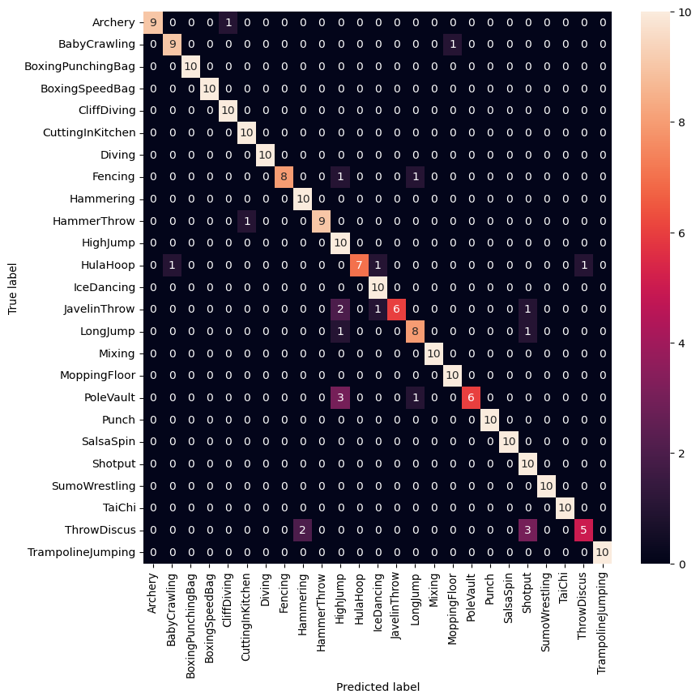

In [ ]:
from PIL import Image
import IPython.display as display

# Open the image
image_path = '/content/video_classification/Confusion_martix_test.png'  # Replace with the actual path to your image
image = Image.open(image_path)

# Define the desired output size
output_size = (700, 700)  # Replace with your desired size

# Resize the image
image_resized = image.resize(output_size)

# Display the resized image
display.display(image_resized)


## Inferencing using the trained model on GIF

The same can be done on video input by following bellow method

In case of video input with shape ```(1, N*8, 244, 244, 3)``` we can split it into multiple samples with size ```( 1, 8, 244, 244, 3)``` and do the inference in a loop to obtain realtime detection results

Check what the classes are and number of classes

In [ ]:
classes_1 = ['Archery',
 'BabyCrawling',
 'BoxingPunchingBag',
 'BoxingSpeedBag',
 'CliffDiving',
 'CuttingInKitchen',
 'Diving',
 'Fencing',
 'Hammering',
 'HammerThrow',
 'HighJump',
 'HulaHoop',
 'IceDancing',
 'JavelinThrow',
 'LongJump',
 'Mixing',
 'MoppingFloor',
 'PoleVault',
 'Punch',
 'SalsaSpin',
 'Shotput',
 'SumoWrestling',
 'TaiChi',
 'ThrowDiscus',
 'TrampolineJumping']

NUM_CLASSES = len(classes_1)

In [ ]:
import numpy as np

classes_one_hot = classes_1

# Create a list of unique classes
unique_classes = np.unique(classes_one_hot)

# Create one-hot encoded labels
labels = []
for c in classes_1:
    label = np.asarray([1 if c == cls else 0 for cls in unique_classes])
    labels.append(label)

labels_1 = np.asarray(labels)

# print(labels_1)

The provided code is designed for video inference in order to visualize the predicted output. It includes helper `load_gif`, `get_top_k` and `predict_top_k` functions that have been defined to facilitate smooth execution.

In [ ]:
def load_gif(file_path, image_size=(224, 224)):
  """Loads a gif file into a TF tensor."""
  with tf.io.gfile.GFile(file_path, 'rb') as f:
    video = tf.io.decode_gif(f.read())
  video = tf.image.resize(video, image_size)
  video = tf.cast(video, tf.float32) / 255.
  return video

def get_top_k(probs, k=5, label_map=classes_1):
  """Outputs the top k model labels and probabilities on the given video."""
  top_predictions = tf.argsort(probs, axis=-1, direction='DESCENDING')[:k]
  top_labels = tf.gather(label_map, top_predictions, axis=-1)
  top_labels = [label.decode('utf8') for label in top_labels.numpy()]
  top_probs = tf.gather(probs, top_predictions, axis=-1).numpy()
  return tuple(zip(top_labels, top_probs))

def predict_top_k(model, video, k=5, label_map=classes_1):
  """Outputs the top k model labels and probabilities on the given video."""
  outputs = model.predict(video[tf.newaxis])[0]
  probs = tf.nn.softmax(outputs)
  return get_top_k(probs, k=k, label_map=label_map)

This folder is created for storing gif of the later use

In [ ]:
!mkdir sample_gifs

The purpose of the code below is to traverse through all the files in the '/content/video_classification/UCF101_subset/test' directory. It randomly selects five videos from this directory for inference. Subsequently, it converts these selected videos into GIF format and saves them in the '/content/video_classification/sample_gifs' folder. The generated GIFs can be used for future inference tasks.

In [ ]:
import os
import random
from moviepy.editor import VideoFileClip

# Specify the directory path
directory = '/content/video_classification/UCF101_subset/test'
save_dir = '/content/video_classification/sample_gifs'

# Get a list of subdirectories within the main directory
subdirectories = [subdir for subdir in os.listdir(directory) if os.path.isdir(os.path.join(directory, subdir))]


for i in range(5):
    subdir = random.choice(subdirectories)
    # Iterate over each subdirectory
    # for subdir in subdirectories:
    subdir_path = os.path.join(directory, subdir)
    # Get a list of files within the subdirectory with the .avi extension
    files = [file for file in os.listdir(subdir_path) if file.endswith('.avi')]

    # Randomly select a file from the files list
    random_file = random.choice(files)

    # Print the selected file
    print("Random .avi file from", subdir, ":", random_file)
    input = directory+'/'+subdir+'/'+random_file
    clip = VideoFileClip(input)
    output = save_dir+'/'+random_file.split('.')[0]+'.gif'
    print(output)
    clip.write_gif(output)


Random .avi file from HulaHoop : v_HulaHoop_g23_c05.avi
/content/video_classification/sample_gifs/v_HulaHoop_g23_c05.gif
MoviePy - Building file /content/video_classification/sample_gifs/v_HulaHoop_g23_c05.gif with imageio.


Random .avi file from TrampolineJumping : v_TrampolineJumping_g17_c01.avi
/content/video_classification/sample_gifs/v_TrampolineJumping_g17_c01.gif
MoviePy - Building file /content/video_classification/sample_gifs/v_TrampolineJumping_g17_c01.gif with imageio.


t: 100%|██████████| 202/202 [00:23<00:00,  4.24it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/video_classification/UCF101_subset/test/TrampolineJumping/v_TrampolineJumping_g17_c01.avi, 230400 bytes wanted but 0 bytes read,at frame 201/202, at time 6.71/6.71 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Random .avi file from CuttingInKitchen : v_CuttingInKitchen_g24_c01.avi
/content/video_classification/sample_gifs/v_CuttingInKitchen_g24_c01.gif
MoviePy - Building file /content/video_classification/sample_gifs/v_CuttingInKitchen_g24_c01.gif with imageio.


Random .avi file from BoxingPunchingBag : v_BoxingPunchingBag_g16_c03.avi
/content/video_classification/sample_gifs/v_BoxingPunchingBag_g16_c03.gif
MoviePy - Building file /content/video_classification/sample_gifs/v_BoxingPunchingBag_g16_c03.gif with imageio.


Random .avi file from SalsaSpin : v_SalsaSpin_g16_c03.avi
/content/video_classification/sample_gifs/v_SalsaSpin_g16_c03.gif
MoviePy - Building file /content/video_classification/sample_gifs/v_SalsaSpin_g16_c03.gif with imageio.



The provided code iterates through all the files in the '/content/video_classification/sample_gifs' directory. It utilizes these files for video classification and presents the output in the form of a GIF and displays the top five predictions associated with the video classification task.

In [ ]:
save_dir = '/content/video_classification/sample_gifs'
files = [file for file in os.listdir(save_dir) if file.endswith('.gif')]
for file_name in files:
  file_name = save_dir+'/'+file_name
  video = load_gif(file_name, image_size=(244, 244))
  media.show_video(video.numpy(), fps=23)
  outputs = predict_top_k(model, video)
  for label, prob in outputs:
    print(label, prob)

1/1 [==============================] - 19s 19s/step
BoxingPunchingBag 0.37596455
BoxingSpeedBag 0.12756479
Archery 0.11609798
SalsaSpin 0.06077488
TaiChi 0.05066816


1/1 [==============================] - 17s 17s/step
CuttingInKitchen 0.79025894
HammerThrow 0.12847784
MoppingFloor 0.01669947
BoxingSpeedBag 0.012062956
Mixing 0.010674723


1/1 [==============================] - 8s 8s/step
Archery 0.6658951
HulaHoop 0.2322192
MoppingFloor 0.022863882
TaiChi 0.018630039
JavelinThrow 0.0072861086


1/1 [==============================] - 12s 12s/step
SalsaSpin 0.9215285
TaiChi 0.0650831
MoppingFloor 0.0034404935
IceDancing 0.00221932
SumoWrestling 0.002015798


1/1 [==============================] - 13s 13s/step
TrampolineJumping 0.88626164
Shotput 0.029380245
Diving 0.014323213
CliffDiving 0.013398266
TaiChi 0.010328753


In [ ]:
save_dir = '/content/video_classification/sample_gifs'
files = [file for file in os.listdir(save_dir) if file.endswith('.gif')]
for file_name in files:
  file_name = save_dir+'/'+file_name
  video = load_gif(file_name, image_size=(244, 244))
  media.show_video(video.numpy(), fps=23)
  outputs = predict_top_k(model, video)
  for label, prob in outputs:
    print(label, prob)

1/1 [==============================] - 10s 10s/step
HulaHoop 0.9738566
MoppingFloor 0.011693413
Archery 0.008638421
TaiChi 0.002654392
HammerThrow 0.00078460056


1/1 [==============================] - 13s 13s/step
Punch 0.99451125
Fencing 0.0021292602
SumoWrestling 0.0020842152
Hammering 0.000420661
HulaHoop 0.00026896808


1/1 [==============================] - 8s 8s/step
Hammering 0.4008197
ThrowDiscus 0.3214168
Shotput 0.22504431
TaiChi 0.020145841
SumoWrestling 0.008275529


1/1 [==============================] - 13s 13s/step
MoppingFloor 0.8334542
HammerThrow 0.13436949
CuttingInKitchen 0.006440938
LongJump 0.0034990548
BoxingPunchingBag 0.0031371247


1/1 [==============================] - 11s 11s/step
Mixing 0.9053477
BoxingSpeedBag 0.036330886
HammerThrow 0.03174115
CuttingInKitchen 0.01864537
CliffDiving 0.0024345221
